<a href="https://colab.research.google.com/github/reza-dalvand/Iris_detect/blob/main/iris.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import dlib
import numpy as np
import os
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import kagglehub

In [ ]:
def detect_iris(eye_frame):
  gray = cv2.cvtColor(eye_frame, cv2.COLOR_BGR2GRAY)

  blurred = cv2.GaussianBlur(gray, (5, 5), 0)

  circles = cv2.HoughCircles(
      blurred,
      cv2.HOUGH_GRADIENT,
      dp=1.2,
      minDist=10,
      param1=100,
      param2=15,
      minRadius=5,
      maxRadius=25
  )

  if circles is not None:
      circles = np.uint16(np.around(circles))
      for i in circles[0, :1]:
          cx, cy, radius = i[0], i[1], i[2]
          return (cx, cy, radius)

  return None

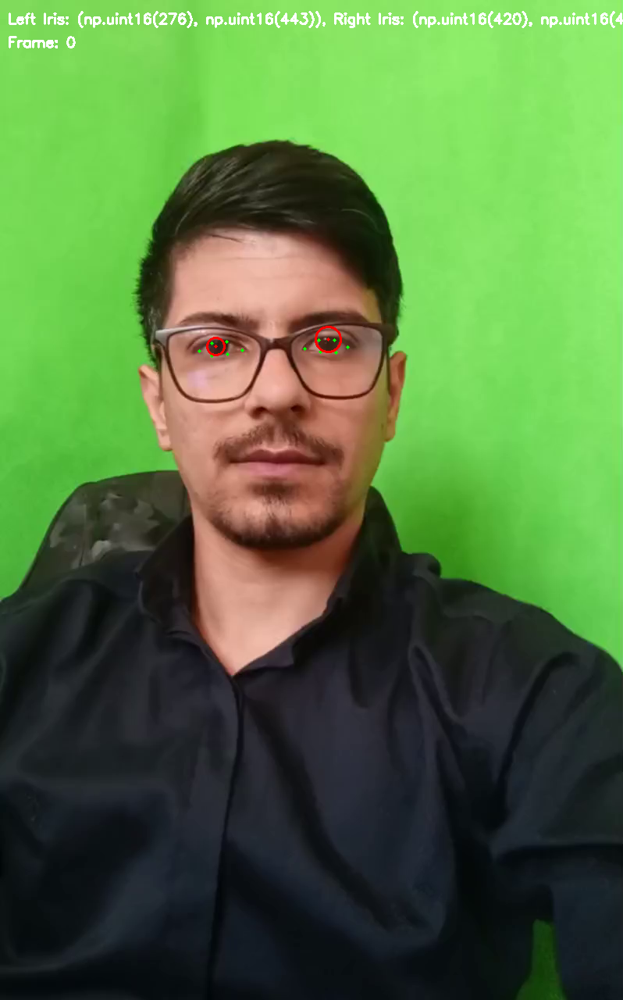

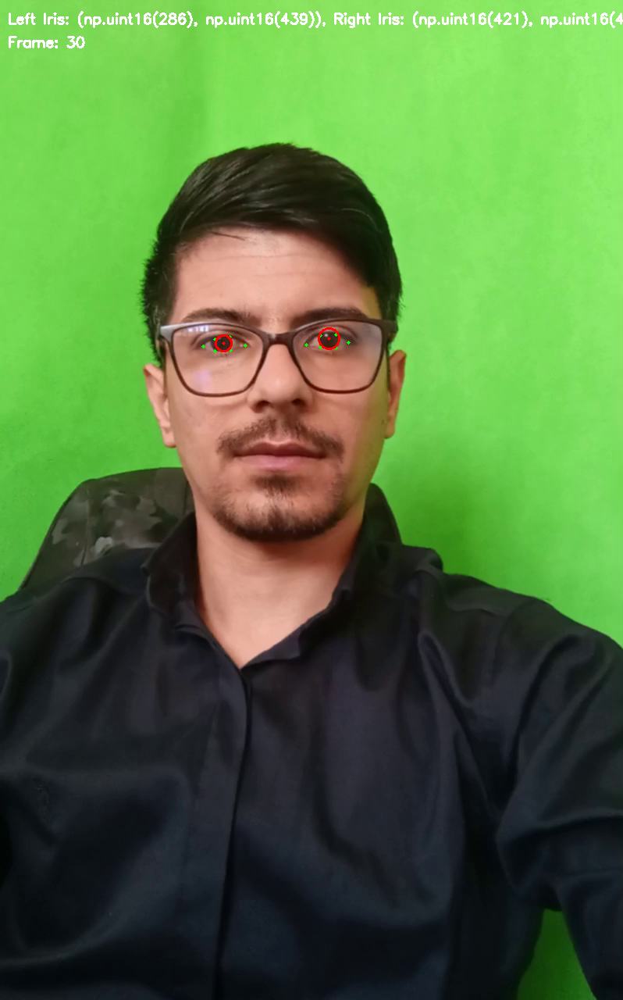

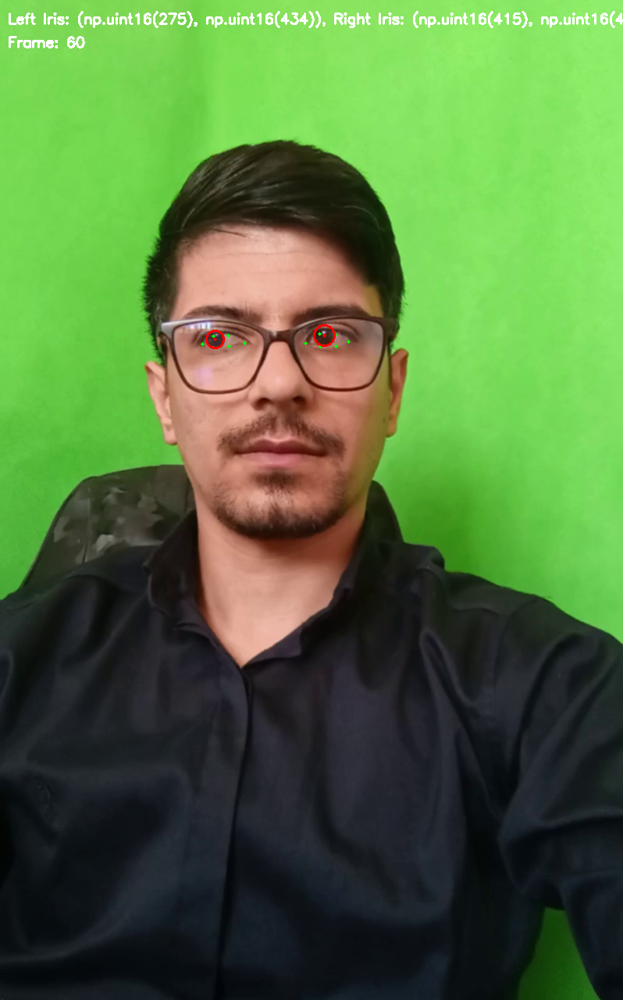

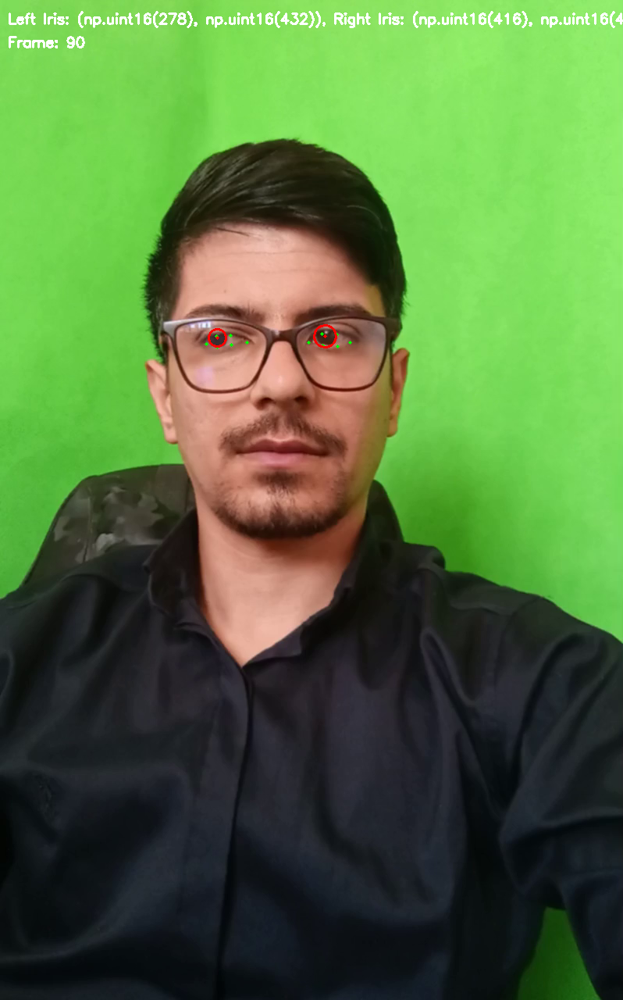

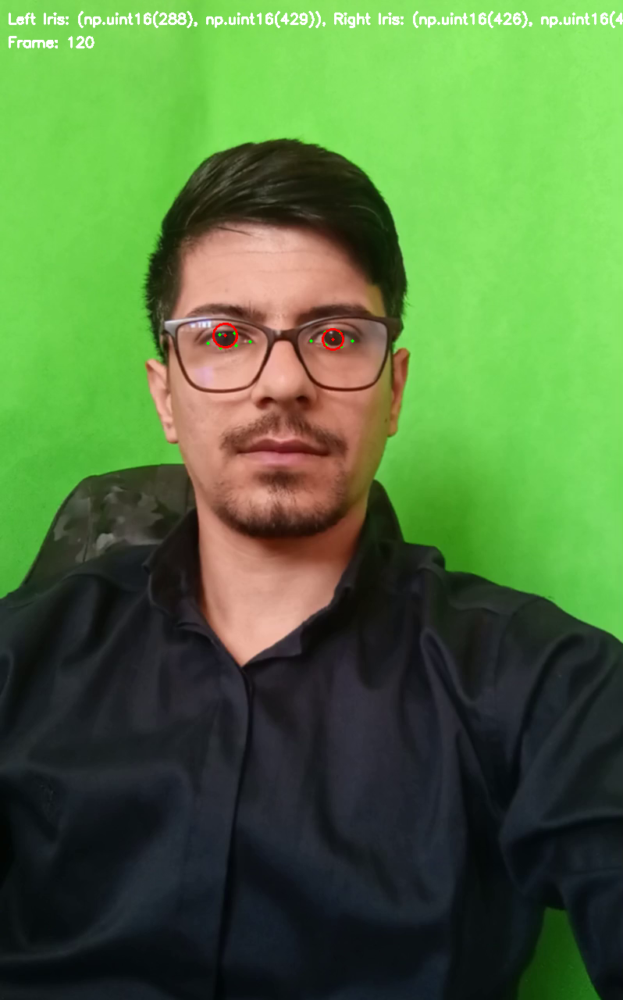

...

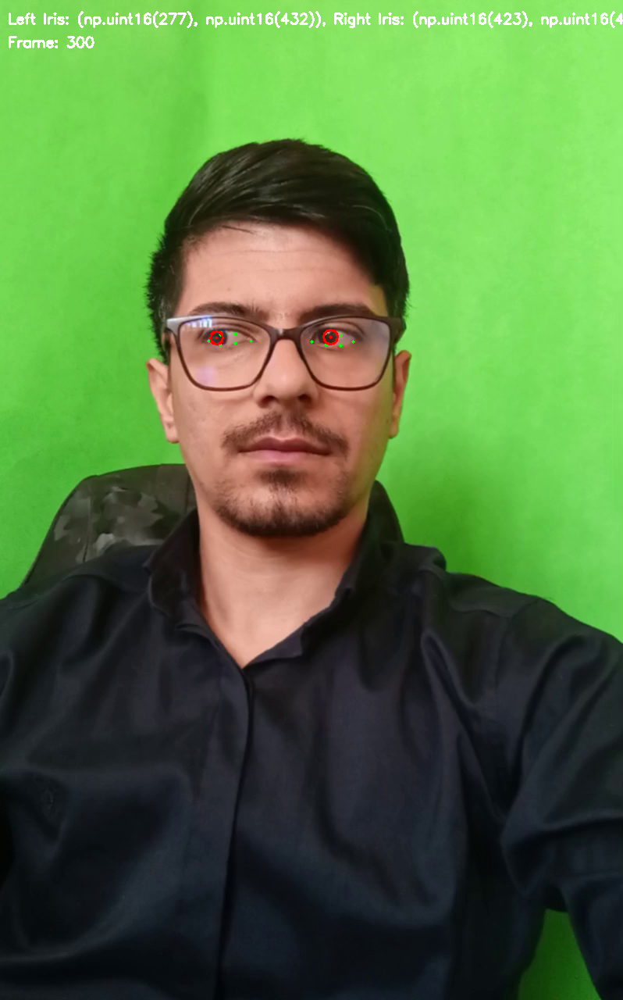

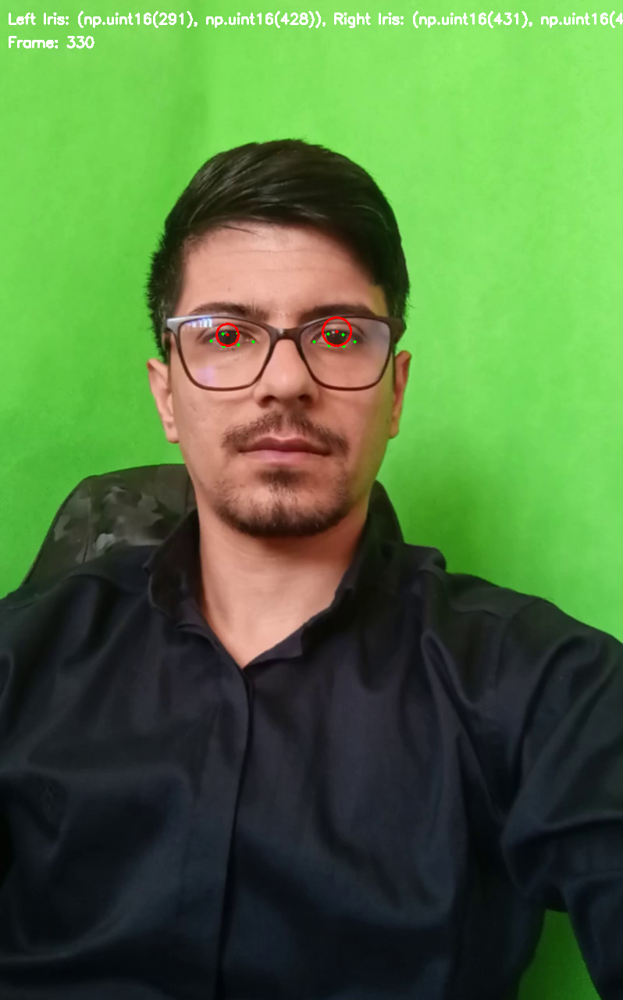

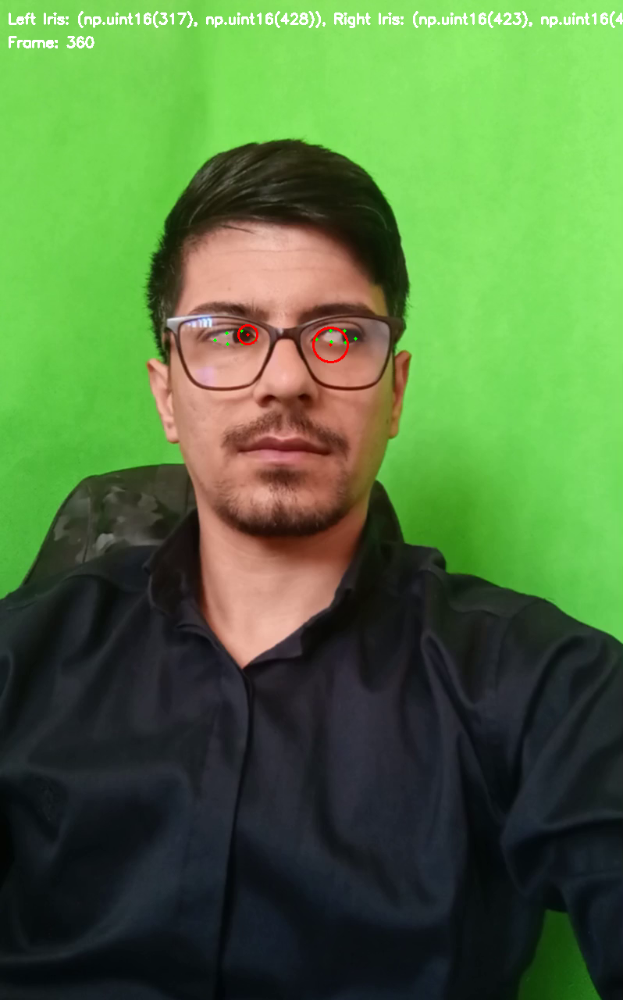

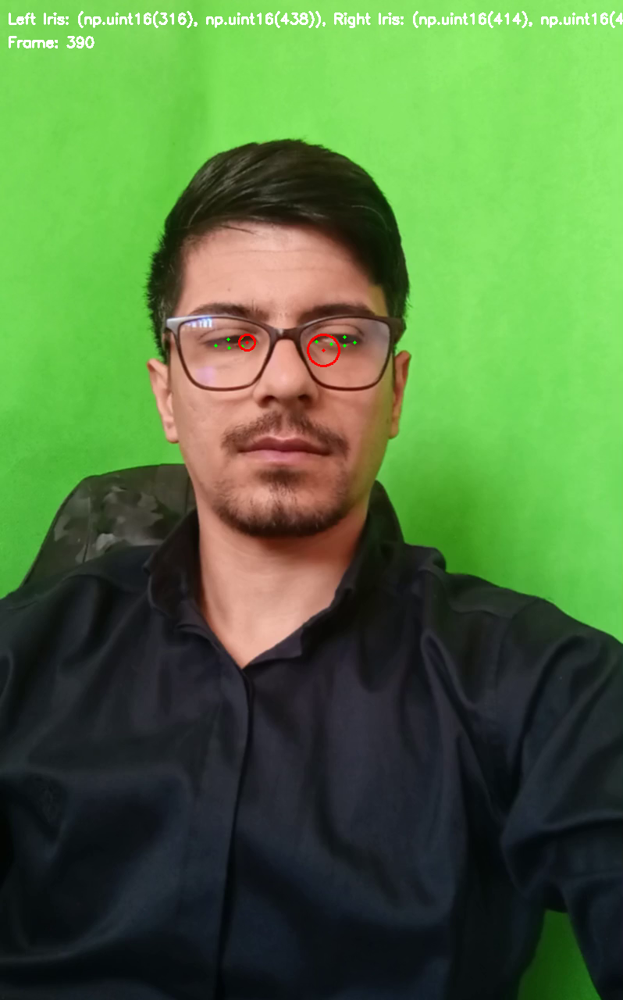

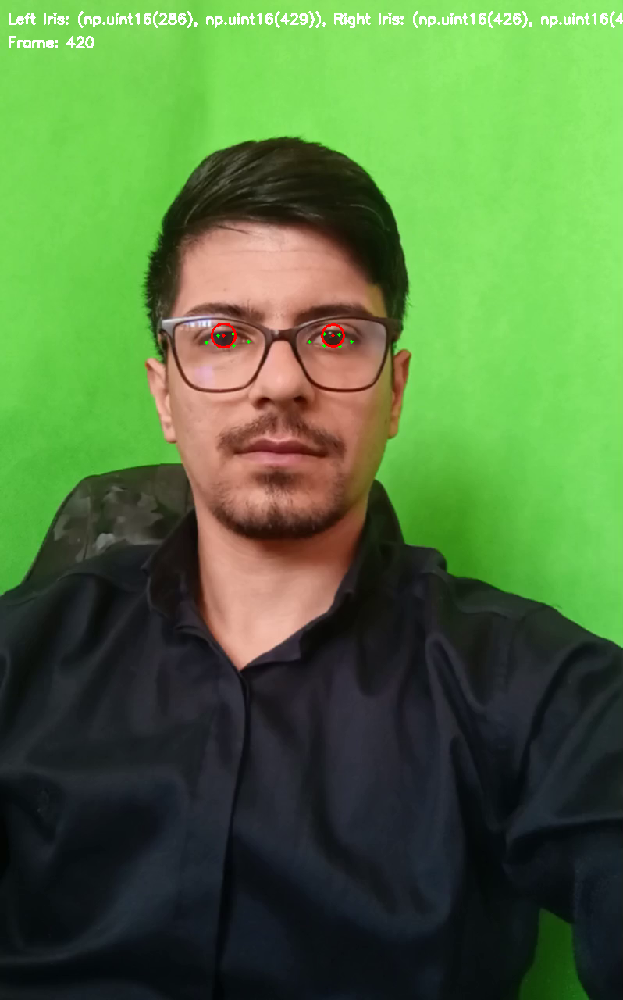

پایان ویدیو یا خطا در خواندن فریم.


In [ ]:
predictor_path = "/kaggle/input/shape-predictor-68-face-landmarksdat/shape_predictor_68_face_landmarks.dat"

detector = dlib.get_frontal_face_detector()

predictor = dlib.shape_predictor(predictor_path)


video_path = '/content/test.mp4'
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print(f"Error: Cannot open video source: {video_path}")
    exit(1)

# get video's info
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))


out = cv2.VideoWriter('iris_tracking_output.mp4',
                     cv2.VideoWriter_fourcc(*'XVID'),
                     fps,
                     (frame_width, frame_height))

# variables for store iris cordinate
left_iris_positions = []
right_iris_positions = []

frame_count = 0

while True:
    ret, frame = cap.read()

    if not ret:
        print("video ended")
        break

    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    faces = detector(rgb_frame)


    for face in faces:
        landmarks = predictor(rgb_frame, face)

        left_eye_points = np.array([(landmarks.part(n).x, landmarks.part(n).y) for n in range(36, 42)])
        right_eye_points = np.array([(landmarks.part(n).x, landmarks.part(n).y) for n in range(42, 48)])

        # draw eye's points
        for point in left_eye_points:
            cv2.circle(frame, tuple(point), 2, (0, 255, 0), -1)
        for point in right_eye_points:
            cv2.circle(frame, tuple(point), 2, (0, 255, 0), -1)

        left_eye_rect = cv2.boundingRect(left_eye_points)
        right_eye_rect = cv2.boundingRect(right_eye_points)

        # add padding
        padding = 5
        left_x = max(0, left_eye_rect[0] - padding)
        left_y = max(0, left_eye_rect[1] - padding)
        left_w = min(frame_width - left_x, left_eye_rect[2] + 2 * padding)
        left_h = min(frame_height - left_y, left_eye_rect[3] + 2 * padding)

        right_x = max(0, right_eye_rect[0] - padding)
        right_y = max(0, right_eye_rect[1] - padding)
        right_w = min(frame_width - right_x, right_eye_rect[2] + 2 * padding)
        right_h = min(frame_height - right_y, right_eye_rect[3] + 2 * padding)

        # extracting eye points
        left_eye_frame = frame[left_y:left_y+left_h, left_x:left_x+left_w]
        right_eye_frame = frame[right_y:right_y+right_h, right_x:right_x+right_w]


        # detect iris in each eye
        left_iris = detect_iris(left_eye_frame)
        right_iris = detect_iris(right_eye_frame)

        # iris cordinate in global frame
        left_iris_global = None
        right_iris_global = None

        if left_iris:
            left_cx, left_cy, left_radius = left_iris
            left_iris_global = (left_x + left_cx, left_y + left_cy)

            cv2.circle(frame, left_iris_global, left_radius, (0, 0, 255), 2)
            cv2.circle(frame, left_iris_global, 2, (0, 0, 255), -1)
            left_iris_positions.append(left_iris_global)
        else:
            left_iris_positions.append(None)

        if right_iris:
            right_cx, right_cy, right_radius = right_iris
            right_iris_global = (right_x + right_cx, right_y + right_cy)

            cv2.circle(frame, right_iris_global, right_radius, (0, 0, 255), 2)
            cv2.circle(frame, right_iris_global, 2, (0, 0, 255), -1)
            right_iris_positions.append(right_iris_global)
        else:
            right_iris_positions.append(None)


        # show info on frame
        info_text = f"Left Iris: {left_iris_global}, Right Iris: {right_iris_global}"
        cv2.putText(frame, info_text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    # show count frame
    cv2.putText(frame, f"Frame: {frame_count}", (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    if frame_count % 30 == 0:
        cv2_imshow(frame)

    out.write(frame)

    frame_count += 1

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()


